## Perform analysis of LA and RA cardiomyocytes

Catherine L Worth, MDC Berlin
<br>
2020 07 20
<br>
catherine.sargent@mdc-berlin.de

Catherine L Worth

In [1]:
import numpy as np
import scipy as sp
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import glob
import bbknn
import os, fnmatch
import requests
import io
import seaborn as sns
import scipy
import anndata
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi = 120, color_map = 'RdBu_r')

/gnu/var/guix/profiles/custom/huebner-sc/.guix-profile/lib/python3.7/site-packages/louvain/Optimiser.py:349: SyntaxWarning: assertion is always true, perhaps remove parentheses?
  assert(issubclass(partition_type, LinearResolutionParameterVertexPartition),


In [2]:
def multivariateGrid(col_x, col_y, col_k, df, k_is_color=False, scatter_alpha=.5, scatter_size=4):
    def colored_scatter(x, y, c=None, scatter_size=scatter_size):
        def scatter(*args, **kwargs):
            args = (x, y)
            if c is not None:
                kwargs['c'] = c
            kwargs['alpha'] = scatter_alpha
            plt.scatter(*args, **kwargs, s=scatter_size)

        return scatter

    g = sns.JointGrid(
        x=col_x,
        y=col_y,
        data=df
    )
    color = None
    legends=[]
    for name, df_group in df.groupby(col_k):
        legends.append(name)
        if k_is_color:
            color=name
        g.plot_joint(
            colored_scatter(df_group[col_x],df_group[col_y],color),
        )
        sns.distplot(
            df_group[col_x].values,
            ax=g.ax_marg_x,
            color=color,
        )
        sns.distplot(
            df_group[col_y].values,
            ax=g.ax_marg_y,
            color=color,            
            vertical=True
        )

    plt.legend(legends)

In [3]:
def regress_batch(adata, batch_key, alpha = 1.0):
    from sklearn.linear_model import Ridge
    dummy = pd.get_dummies(adata.obs[[batch_key]], drop_first = False)
    X_exp = adata.X # scaled data
    LR = Ridge(fit_intercept = False, alpha = alpha)
    LR.fit(dummy, X_exp)
    X_correct = X_exp - LR.predict(dummy)
    adata.X = X_correct

In [4]:
def makevector_topmarkers(anndata, top_n, ldFC_cutoff=0.5, pvals_adj_cutoff=10**-30):
    results=anndata.uns['rank_genes_groups']
    clusters = results['names'].dtype.names
    top_genes=[]
    for cluster in clusters:
        topgenes_cluster=results['names'][cluster][np.where((results['logfoldchanges'][cluster]>=ldFC_cutoff) & (results['pvals_adj'][cluster]<(pvals_adj_cutoff)))][0:top_n]
        top_genes.extend(topgenes_cluster)
    return(top_genes)

In [5]:
def stacked_barplot_plain_region(adata, xaxis, stack, xaxis_label, legend_label, file_name, shift_top=0.2, xaxis_rotation=0):
    tmp=pd.crosstab(adata.obs[xaxis],
                adata.obs[stack]).sum(axis=1)
    ax= pd.crosstab(adata.obs[xaxis],
                    adata.obs[stack]).apply(lambda r: r/r.sum()*100, axis=1)
    ax_1 = ax.plot.bar(figsize=(10,10),stacked=True, rot=0, width=0.22)

    #display(ax)
    #plt.legend(title="Subject") # loc='upper center', bbox_to_anchor=(0.1, 1.0),
    lgd = plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title=legend_label, frameon=False)
    plt.xlabel(xaxis_label)
    plt.ylabel('Percent Distribution')
    #for rec in ax_1.patches:
     #   height = rec.get_height()
        #ax_1.text(rec.get_x() + rec.get_width() / 2, rec.get_y() + height/2, "{:.0f}%".format(height),
        #       ha = 'center', va='center') #
    for xaxistick in range(ax.shape[0]):
        ax_1.text(xaxistick-shift_top,110,tmp[xaxistick],va='center', rotation=360)
    plt.xticks(rotation=xaxis_rotation)
    ax_1.grid(False)
    #ax_1.grid(which='major', alpha=0.5)
    #lat.grid(alpha=0.5, linestyle='solid')
    plt.savefig(file_name, bbox_extra_artists=(lgd,), bbox_inches='tight')

    plt.show()

In [6]:
def stacked_barplot_plain_donor(adata, xaxis, stack, xaxis_label, legend_label, file_name, shift_top=0.2, xaxis_rotation=0):
    tmp=pd.crosstab(adata.obs[xaxis],
                adata.obs[stack]).sum(axis=1)
    ax= pd.crosstab(adata.obs[xaxis],
                    adata.obs[stack]).apply(lambda r: r/r.sum()*100, axis=1)
    ax_1 = ax.plot.bar(figsize=(10,10),stacked=True, rot=0)

    #display(ax)
    #plt.legend(title="Subject") # loc='upper center', bbox_to_anchor=(0.1, 1.0),
    lgd = plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title=legend_label, frameon=False)
    plt.xlabel(xaxis_label)
    plt.ylabel('Percent Distribution')
    #for rec in ax_1.patches:
     #   height = rec.get_height()
        #ax_1.text(rec.get_x() + rec.get_width() / 2, rec.get_y() + height/2, "{:.0f}%".format(height),
        #       ha = 'center', va='center') #
    for xaxistick in range(ax.shape[0]):
        ax_1.text(xaxistick-shift_top,110,tmp[xaxistick],va='center', rotation=45)
    plt.xticks(rotation=xaxis_rotation)
    ax_1.grid(False)
    #ax_1.grid(which='major', alpha=0.5)
    #lat.grid(alpha=0.5, linestyle='solid')
    plt.savefig(file_name, bbox_extra_artists=(lgd,), bbox_inches='tight')

    plt.show()

In [7]:
def filter_by_expression(adata_obj, DE_column, key='rank_genes_groups'):
    def to_tensor(dataframe, columns = [], dtypes = {}, index = False):
        to_records_kwargs = {'index': index}
        if not columns:  # Default to all `dataframe.columns`
            columns = dataframe.columns
        if dtypes:       # Pull in modifications only for dtypes listed in `columns`
            to_records_kwargs['column_dtypes'] = {}
            for column in dtypes.keys():
                if column in columns:
                    to_records_kwargs['column_dtypes'].update({column: dtypes.get(column)})
        return dataframe[columns].to_records(**to_records_kwargs)
    
    gene_names = pd.DataFrame(adata_obj.uns[key]['names'])
    fraction_in_cluster_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    fraction_notin_cluster_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    in_cluster_expr_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    notin_cluster_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    allin_cluster_expr_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    allnotin_cluster_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )

    for cluster_number in fraction_in_cluster_matrix.columns:
        dummy=adata_obj.raw[:, adata_obj.uns['rank_genes_groups']['names'][cluster_number].tolist()]
        dummy.obs=adata_obj.obs
        subset_cluster=dummy[dummy.obs[DE_column].isin([cluster_number])]
        subset_notin_cluster=dummy[np.logical_not(dummy.obs[DE_column].isin([cluster_number]))]
        
   
        # Percent of cluster expressing
        if subset_cluster.shape[0] != 0:
            total_incluster=subset_cluster.shape[0]
        else: 
            total_incluster=np.nan

        if subset_notin_cluster.shape[0] != 0:
            total_outcluster=subset_notin_cluster.shape[0]
        else: 
            total_outcluster=np.nan
        
        fraction_in_cluster_matrix[cluster_number]=[(subset_cluster.X[:,gene_toanalyze].count_nonzero()/total_incluster) for gene_toanalyze in fraction_in_cluster_matrix.index]
        fraction_notin_cluster_matrix[cluster_number]=[(subset_notin_cluster.X[:,gene_toanalyze].count_nonzero()/total_outcluster) for gene_toanalyze in fraction_notin_cluster_matrix.index]

        #fraction_in_cluster_matrix[cluster_number]=[(subset_cluster.X[:,gene_toanalyze].count_nonzero()/subset_cluster.shape[0]) for gene_toanalyze in fraction_in_cluster_matrix.index]
        #fraction_notin_cluster_matrix[cluster_number]=[(subset_notin_cluster.X[:,gene_toanalyze].count_nonzero()/subset_notin_cluster.shape[0]) for gene_toanalyze in fraction_notin_cluster_matrix.index]
        
        # Expression level (only by expressed)
        in_cluster_expr_matrix[cluster_number]=[(subset_cluster.X[:,gene_toanalyze][subset_cluster.X[:,gene_toanalyze].nonzero()].mean()) for gene_toanalyze in in_cluster_expr_matrix.index]
        notin_cluster_matrix[cluster_number]=[(subset_notin_cluster.X[:,gene_toanalyze][subset_notin_cluster.X[:,gene_toanalyze].nonzero()].mean()) for gene_toanalyze in notin_cluster_matrix.index]
    
        # Expression_all in cluster
        allin_cluster_expr_matrix[cluster_number]=[(subset_cluster.X[:,gene_toanalyze].mean()) for gene_toanalyze in allin_cluster_expr_matrix.index]
        allnotin_cluster_matrix[cluster_number]=[(subset_notin_cluster.X[:,gene_toanalyze].mean()) for gene_toanalyze in allnotin_cluster_matrix.index]

    # Generate the last table results
    result = adata_obj.uns['rank_genes_groups']
    groups = result['names'].dtype.names
    result['pc_cells_in'] = to_tensor(fraction_in_cluster_matrix)
    result['pc_cells_out'] = to_tensor(fraction_notin_cluster_matrix)
    result['expr_in'] = to_tensor(allin_cluster_expr_matrix)
    result['expr_out'] = to_tensor(allnotin_cluster_matrix)
    
    results =pd.DataFrame(
        {group + '_' + key: result[key][group]
        for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges', 'pc_cells_in', 'pc_cells_out', "expr_in", "expr_out"]})

    return results
    

In [8]:
def correlation_analysis(scanpy_object, column_tosplitby):
    d = {}
    for cluster_number in np.unique(scanpy_object.obs[column_tosplitby].values):
        #cluster_number=np.unique(heart.obs['louvain_annotated'].values)[1]
        scanpy_object_subset = scanpy_object[scanpy_object.obs[column_tosplitby].isin([cluster_number])]
        d[cluster_number] = np.squeeze(np.asarray(scanpy_object_subset.raw.X.mean(axis=0))) #np.log(+1)
        del scanpy_object_subset
        
    return d

In [9]:
parent_path = '/fast/AG_Huebner/huebner3/ANALYSES/20191112_cs_HH_England/scanpy/'
current_results_round = '20200629'

date_dir = parent_path + current_results_round + '/'

if not os.path.exists(date_dir):
    os.makedirs(date_dir, mode=0o775)

In [10]:
analysis = 'LA_RA_cms'
analysis_dir = date_dir + analysis + "/"

if not os.path.exists(analysis_dir):
    os.makedirs(analysis_dir, mode=0o775)

In [11]:
results_dir = analysis_dir + 'Results/'

if not os.path.exists(results_dir):
    os.makedirs(results_dir, mode=0o775)

In [12]:
sc.settings.figdir = results_dir + 'Figures/'

if not os.path.exists(sc.settings.figdir):
    os.makedirs(sc.settings.figdir, mode=0o775)

In [13]:
tables_dir = results_dir + 'Tables/'

if not os.path.exists(tables_dir):
    os.makedirs(tables_dir, mode=0o775)

In [14]:
input_file = '/fast/AG_Huebner/huebner3/ANALYSES/20191112_cs_HH_England/scanpy/20200423/cms/Results/Bos_Cam_cardiomyocytes_RAW_20200423_processed.h5ad'
raw_filtered_file = results_dir + 'Bos_Cam_atrial_cardiomyocytes_RAW_' + current_results_round + '_processed.h5ad'
results_file = results_dir + 'Bos_Cam_atrial_cardiomyocytes_' + current_results_round + '_processed.h5ad'
bbknn_results_file = results_dir + 'Bos_Cam_atrial_cardiomyocytes_' + current_results_round + '_bbknn.h5ad'

### Read in cardiomyocyte object

In [15]:
CB_BOS_cm = sc.read_h5ad(input_file)

In [16]:
CB_BOS_cm.shape

(148772, 33538)

Extract all nuclei from just LA and RA

In [17]:
CB_BOS_atrial = CB_BOS_cm[CB_BOS_cm.obs['region'].isin(['LA', 'RA'])]

In [18]:
CB_BOS_atrial.shape

(23483, 33538)

### Sub-clustering of atrial cardiomyocytes

saving figure to file /fast/AG_Huebner/huebner3/ANALYSES/20191112_cs_HH_England/scanpy/20200629/LA_RA_cms/Results/Figures/violin_CMs_QC.png


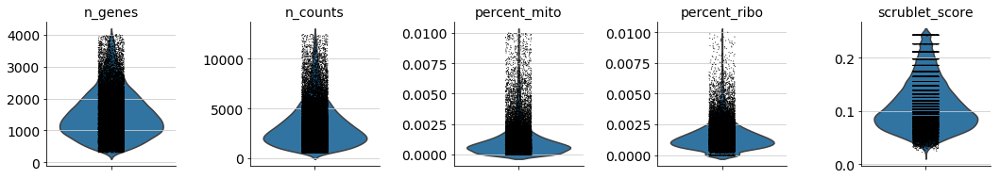

In [19]:
sc.pl.violin(CB_BOS_atrial, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo', 'scrublet_score'],
             jitter=0.1, multi_panel=True, save = '_aCMs_QC.png')

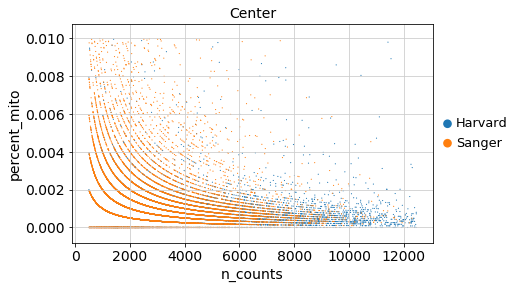

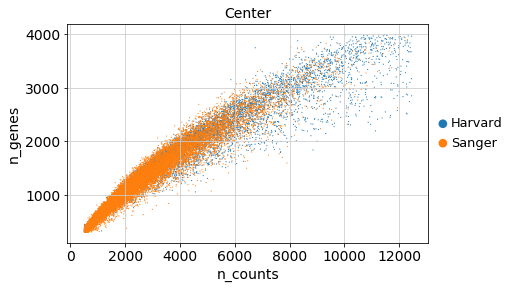

In [20]:
sc.pl.scatter(CB_BOS_atrial, x='n_counts', y='percent_mito', color='Center')
sc.pl.scatter(CB_BOS_atrial, x='n_counts', y='n_genes', color='Center')

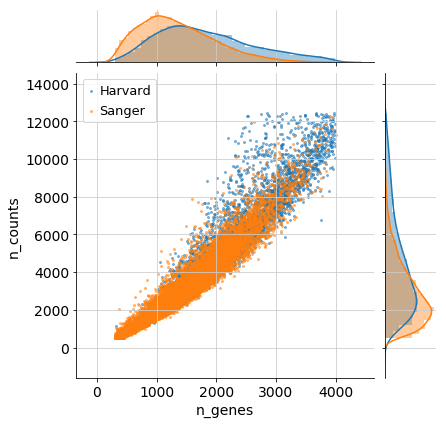

In [21]:
multivariateGrid('n_genes', 'n_counts', 'Center', CB_BOS_atrial.obs, k_is_color=False, scatter_alpha=.5, scatter_size=4)

saving figure to file /fast/AG_Huebner/huebner3/ANALYSES/20191112_cs_HH_England/scanpy/20200629/LA_RA_cms/Results/Figures/violin_CMs_QC_institute.png


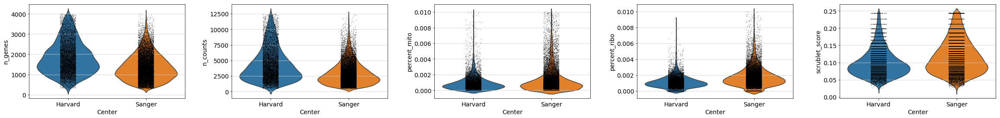

In [22]:
sc.pl.violin(CB_BOS_atrial, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo', 'scrublet_score'],
             jitter=0.1, groupby ='Center', save = '_aCMs_QC_institute.png')

In [23]:
CB_BOS_atrial.write(raw_filtered_file)

In [24]:
sc.pp.normalize_per_cell(CB_BOS_atrial, counts_per_cell_after=1e4)

In [25]:
sc.pp.log1p(CB_BOS_atrial)

In [26]:
CB_BOS_atrial.raw = CB_BOS_atrial

--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


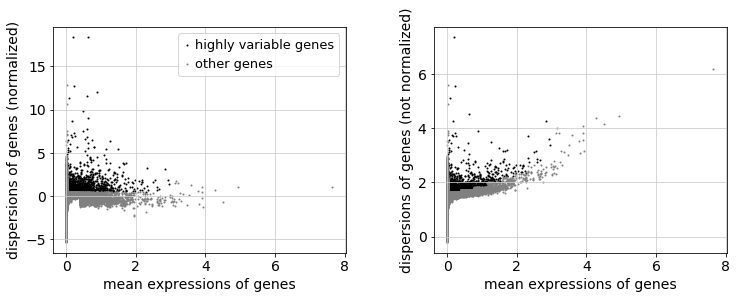

regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:00:34.25)


(23483, 3497)

In [27]:
sc.pp.highly_variable_genes(CB_BOS_atrial)
sc.pl.highly_variable_genes(CB_BOS_atrial)
cm_hvg = CB_BOS_atrial[:, CB_BOS_atrial.var['highly_variable']]
sc.pp.regress_out(cm_hvg, ['n_counts', 'percent_mito'])
sc.pp.scale(cm_hvg, max_value = 10)
cm_hvg.shape

saving figure to file /fast/AG_Huebner/huebner3/ANALYSES/20191112_cs_HH_England/scanpy/20200629/LA_RA_cms/Results/Figures/pca_cm_PCs.png


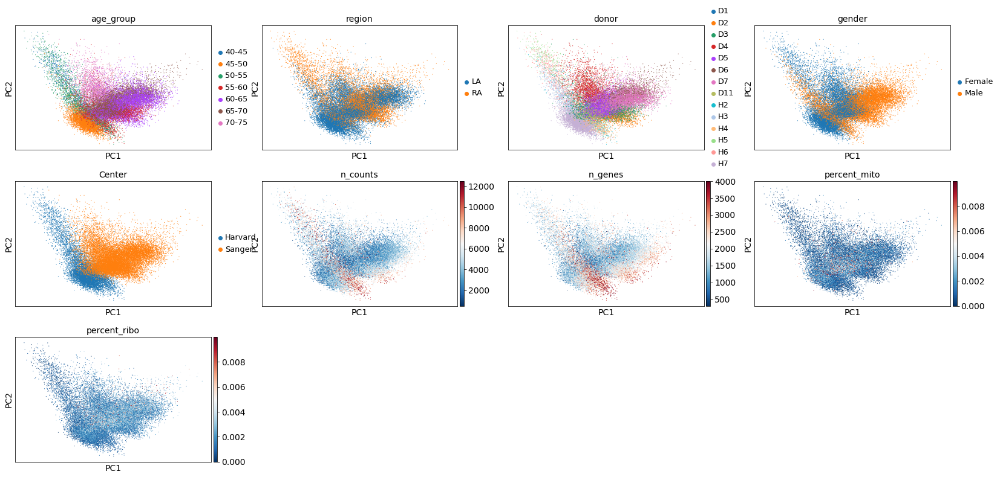

In [28]:
sc.tl.pca(cm_hvg, svd_solver = 'arpack', random_state = 100)
sc.pl.pca(cm_hvg, color = ['age_group', 'region', 'donor', 'gender', 'Center', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo'],save='_aCM_PCs.png')

In [29]:
pd.value_counts(cm_hvg.obs['region'])

LA    14772
RA     8711
Name: region, dtype: int64

In [30]:
pd.value_counts(cm_hvg.obs['gender'])

Male      12332
Female    11151
Name: gender, dtype: int64

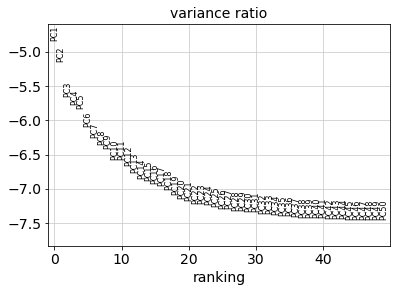

In [31]:
sc.pl.pca_variance_ratio(cm_hvg, log=True, n_pcs = 50)

In [32]:
cm_bbknn = cm_hvg.copy()
regress_batch(cm_bbknn, 'donor', alpha = 1.0)
sc.pp.pca(cm_bbknn, svd_solver = 'arpack', random_state = 100)
bbknn.bbknn(cm_bbknn, batch_key = 'donor',  neighbors_within_batch = 6)
sc.tl.umap(cm_bbknn, min_dist = 0.1, spread = 2, random_state = 100)

computing batch balanced neighbors
    finished (0:00:22.50) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing UMAP
    finished (0:00:37.04) --> added
    'X_umap', UMAP coordinates (adata.obsm)


In [33]:
cm_bbknn.write(bbknn_results_file)

In [34]:
from IPython.display import display
from IPython.display import Image

In [35]:
sc.settings.set_figure_params(dpi = 120, color_map = 'RdBu_r')

running Leiden clustering
    finished (0:01:37.38) --> found 6 clusters and added
    'leiden', the cluster labels (adata.obs, categorical)
saving figure to file /fast/AG_Huebner/huebner3/ANALYSES/20191112_cs_HH_England/scanpy/20200629/LA_RA_cms/Results/Figures/umap_CMs_bbknn_resn_0.75.png


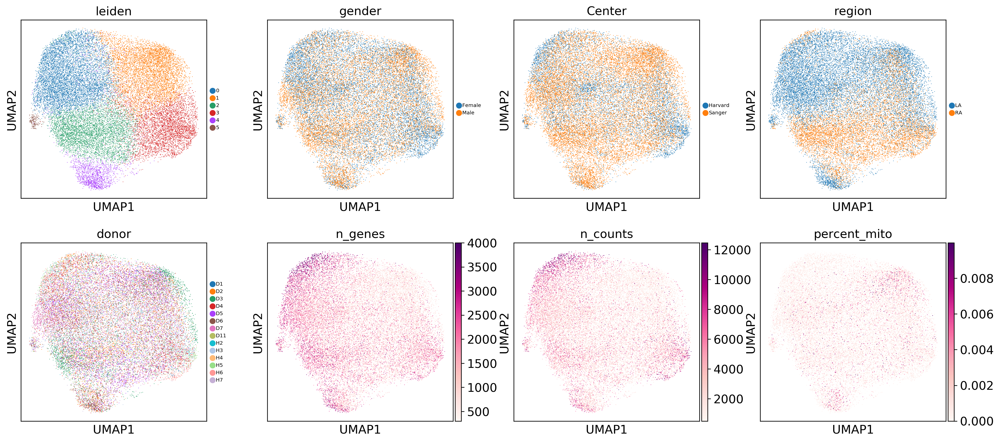

ranking genes
    finished (0:00:49.82) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids
saving figure to file /fast/AG_Huebner/huebner3/ANALYSES/20191112_cs_HH_England/scanpy/20200629/LA_RA_cms/Results/Figures/rank_genes_groups_leiden_CMs_resolution_0.75.png


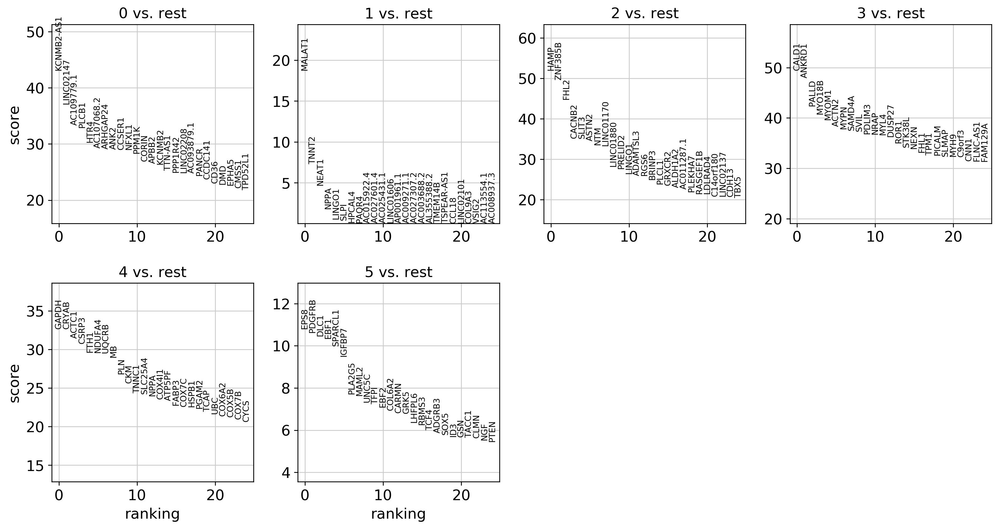

/gnu/var/guix/profiles/custom/huebner-sc/.guix-profile/lib/python3.7/site-packages/scipy/sparse/base.py:583: RuntimeWarning: divide by zero encountered in true_divide
  return self.astype(np.float_)._mul_scalar(1./other)


saving figure to file /fast/AG_Huebner/huebner3/ANALYSES/20191112_cs_HH_England/scanpy/20200629/LA_RA_cms/Results/Figures/dotplot_atrial_cm_wilcox_marker_top10_0.75.png


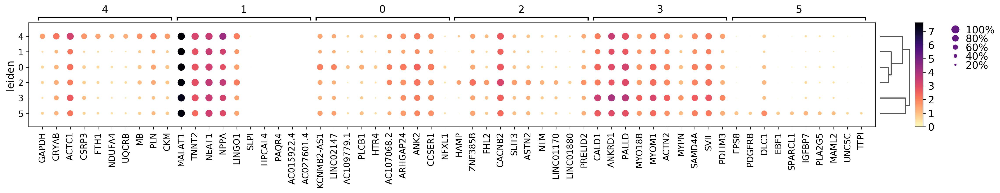

saving figure to file /fast/AG_Huebner/huebner3/ANALYSES/20191112_cs_HH_England/scanpy/20200629/LA_RA_cms/Results/Figures/dotplot_atrial_cm_wilcox_marker_top10_0.75_filtered.png


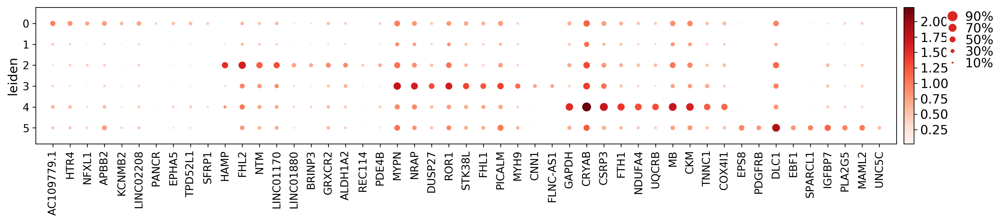

In [36]:
resolutions = ['0.75']
umap_array = []
dotplot_array = []
dotplot_filtered_array = []
for resolution in resolutions:
    sc.tl.leiden(cm_bbknn, resolution = float(resolution), random_state = 100)
    sc.pl.umap(cm_bbknn, color = ['leiden', 'gender', 'Center', 'region', 'donor', 'n_genes', 'n_counts', 'percent_mito'], size = 2, legend_fontsize = 6, save='_CMs_bbknn_resn_' + resolution + '.png', color_map = 'RdPu')
    leiden_name = 'leiden_' + resolution
    cm_bbknn.obs[leiden_name] = cm_bbknn.obs['leiden']
    sc.tl.rank_genes_groups(cm_bbknn, 'leiden', method = 'wilcoxon')
    sc.pl.rank_genes_groups(cm_bbknn, n_genes=25, sharey=False, save = "_CMs_resolution_" + resolution + ".png")
    i = Image(filename= sc.settings.figdir + "umap_CMs_bbknn_resn_" + resolution + ".png")
    umap_array.append(i)
    wilcox_clusters = filter_by_expression(cm_bbknn, 'leiden', key='rank_genes_groups')
    wilcox_clusters.to_csv(tables_dir + 'atrial_cm_bbknn_subclusters_wilcox_markers_' + resolution + '.csv')
    sc.pl.rank_genes_groups_dotplot(cm_bbknn, n_genes = 10, color_map = 'magma_r', save = '_atrial_cm_wilcox_marker_top10_' + resolution + '.png')
    j = Image(filename= sc.settings.figdir + 'dotplot_atrial_cm_wilcox_marker_top10_' + resolution + '.png')
    dotplot_array.append(j)
    
    sc.pl.dotplot(cm_bbknn,
              makevector_topmarkers(cm_bbknn, 10, ldFC_cutoff=0.8, pvals_adj_cutoff=10**-10),
              groupby='leiden', use_raw=True, save = '_atrial_cm_wilcox_marker_top10_' + resolution + '_filtered.png')
    k = Image(filename= sc.settings.figdir + 'dotplot_atrial_cm_wilcox_marker_top10_' + resolution + '_filtered.png')
    dotplot_filtered_array.append(k)

    cm_bbknn.write(bbknn_results_file)

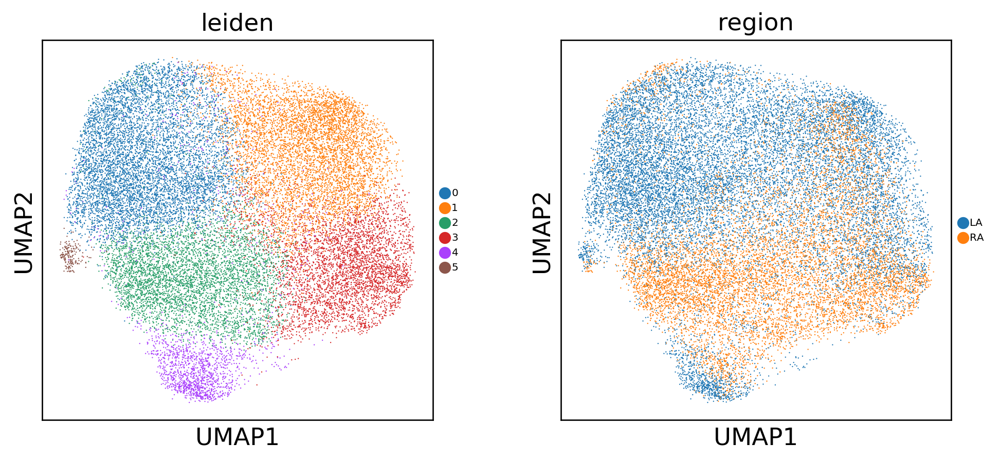

In [37]:
sc.pl.umap(cm_bbknn, color = ['leiden', 'region'], size = 2, legend_fontsize = 6)

In [38]:
cm_bbknn.write(bbknn_results_file)

Check the correlation between clusters to see if any should be merged

In [39]:
subset_=sc.AnnData(cm_bbknn.raw[:,cm_bbknn.var.index].X,
                  obs=cm_bbknn.obs,
                  var=cm_bbknn.var,
                  obsm=cm_bbknn.obsm,
                 )

subset_.raw=subset_

In [40]:
x=correlation_analysis(subset_, 'leiden')
x=pd.DataFrame.from_dict(x)
x['genes']=subset_.var.index

In [41]:
x.corr(method='pearson').style.background_gradient(cmap='coolwarm')

,0,1,2,3,4,5
0,1,0.978099,0.948348,0.910794,0.916727,0.933984
1,0.978099,1,0.959609,0.943747,0.946723,0.936708
2,0.948348,0.959609,1,0.900656,0.919607,0.913274
3,0.910794,0.943747,0.900656,1,0.876434,0.907131
4,0.916727,0.946723,0.919607,0.876434,1,0.878954
5,0.933984,0.936708,0.913274,0.907131,0.878954,1


Clusters 0 and 1 should be merged

### Merge and annotate clusters

In [42]:
cm_bbknn.obs['leiden_merged'] = cm_bbknn.obs['leiden']

In [43]:
cm_bbknn.obs['leiden_merged']
subs = {
    "0":"0",
    "1":"0",
    "2":"1",
    "3":"2",
    "4":"3",
    "5":"4",
     }
#rev_subs = { v:k for k,v in subs.items()}
x=[subs.get(item,item)  for item in cm_bbknn.obs['leiden_merged']]
cm_bbknn.obs['leiden_merged']=x
pd.value_counts(cm_bbknn.obs['leiden_merged'])

0    12885
1     4733
2     4096
3     1581
4      188
Name: leiden_merged, dtype: int64

ranking genes


... storing 'leiden_merged' as categorical


    finished (0:00:49.93) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids


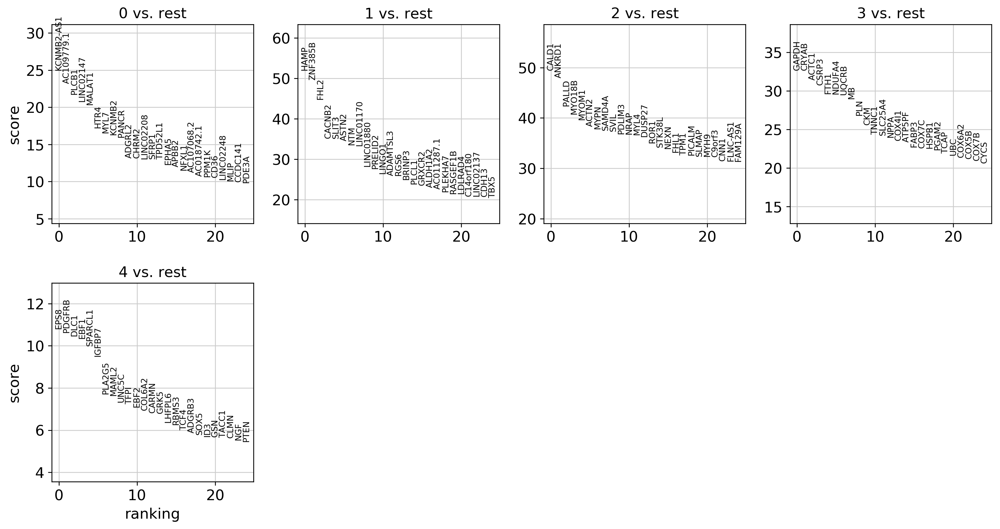

In [47]:
sc.tl.rank_genes_groups(cm_bbknn, 'leiden_merged', method = 'wilcoxon')
sc.pl.rank_genes_groups(cm_bbknn, n_genes=25, sharey=False)

In [48]:
wilcox_clusters = filter_by_expression(cm_bbknn, 'leiden_merged', key='rank_genes_groups')

In [49]:
wilcox_clusters.to_csv(tables_dir + 'atrial_cm_bbknn_subclusters_wilcox_markers_merged.csv')

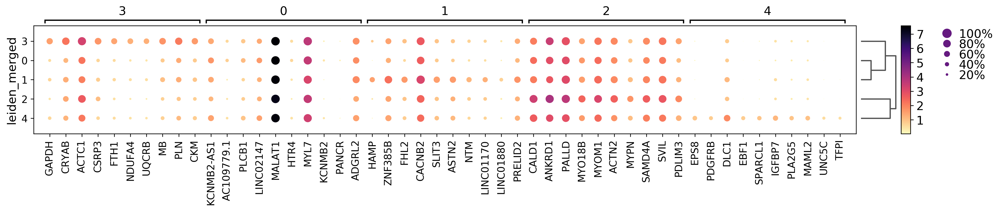

In [50]:
sc.pl.rank_genes_groups_dotplot(cm_bbknn, n_genes = 10, color_map = 'magma_r')

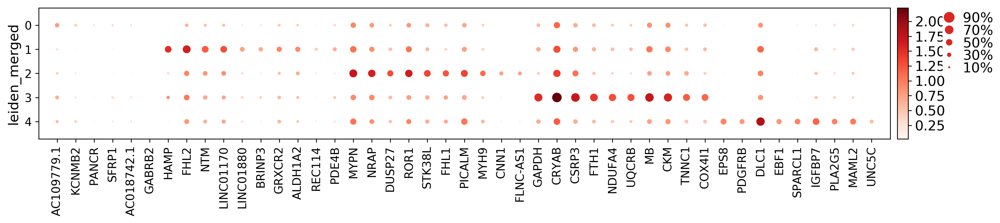

In [51]:
sc.pl.dotplot(cm_bbknn,
              makevector_topmarkers(cm_bbknn, 10, ldFC_cutoff=0.8, pvals_adj_cutoff=10**-10),
              groupby='leiden_merged', use_raw=True)

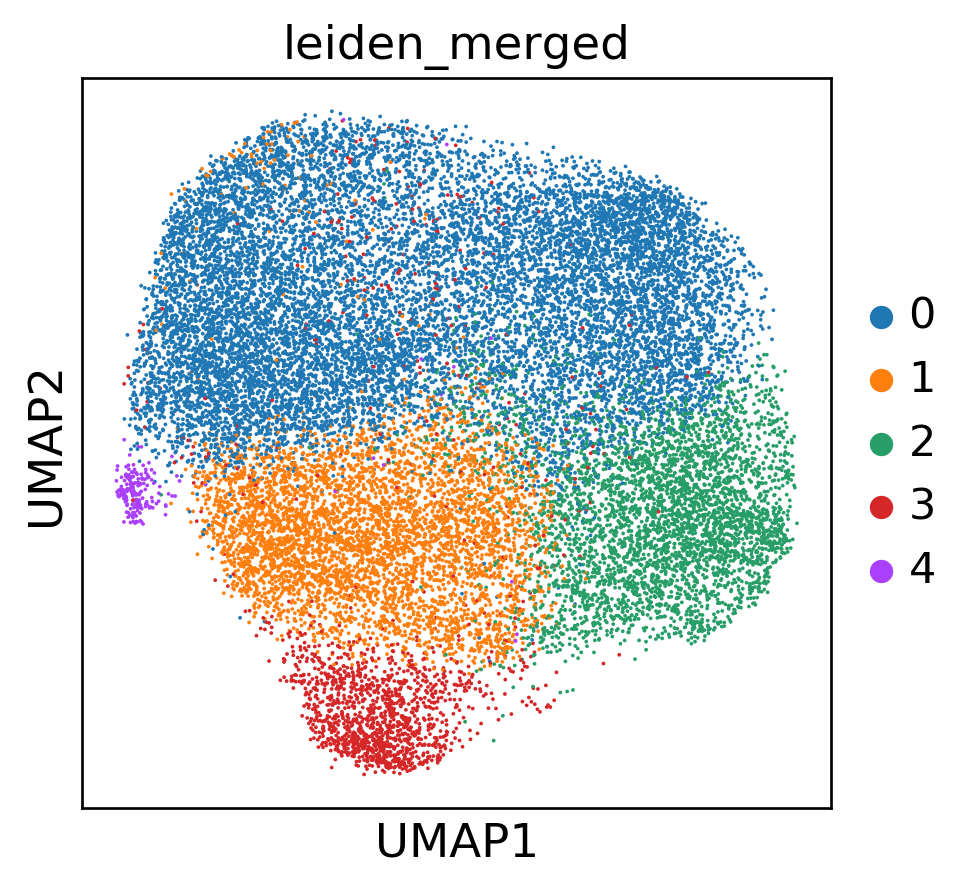

In [52]:
sc.pl.umap(cm_bbknn,color=['leiden_merged'], color_map = 'RdPu')

In [53]:
cm_bbknn.write(bbknn_results_file)

In [54]:
cm_cluster_names = [
    'aCM1', 'aCM2', 'aCM3', 
    'aCM4', 'aCM5' 
]
cm_bbknn.obs['cell_states'] = cm_bbknn.obs['leiden_merged']
cm_bbknn.obs['cell_states'].cat.categories = cm_cluster_names

In [55]:
sc.settings.set_figure_params(dpi = 120, dpi_save=300, color_map = 'RdBu_r')

saving figure to file /fast/AG_Huebner/huebner3/ANALYSES/20191112_cs_HH_England/scanpy/20200629/LA_RA_cms/Results/Figures/umap_atrial_cm_bbknn_cell_states.png


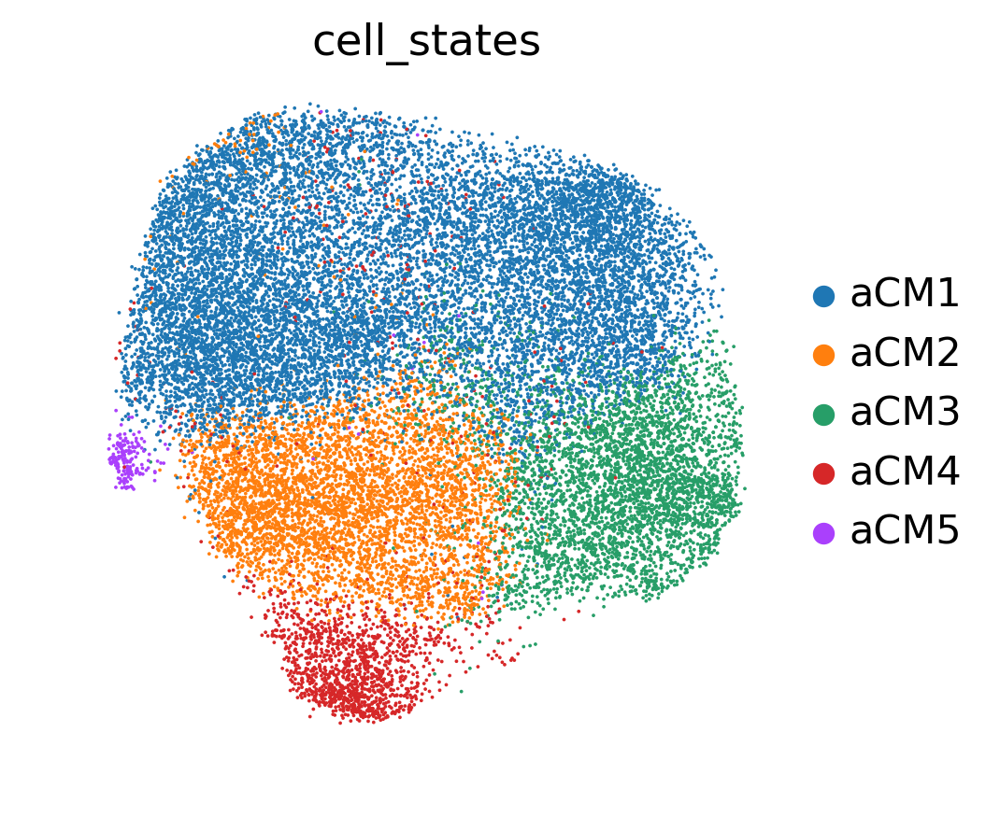

In [57]:
sc.pl.umap(cm_bbknn,color=['cell_states'], save = "_atrial_cm_bbknn_cell_states.png", color_map = 'RdPu', frameon = False)

In [59]:
cm_bbknn.write(bbknn_results_file)

ranking genes
    finished (0:00:49.39) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids


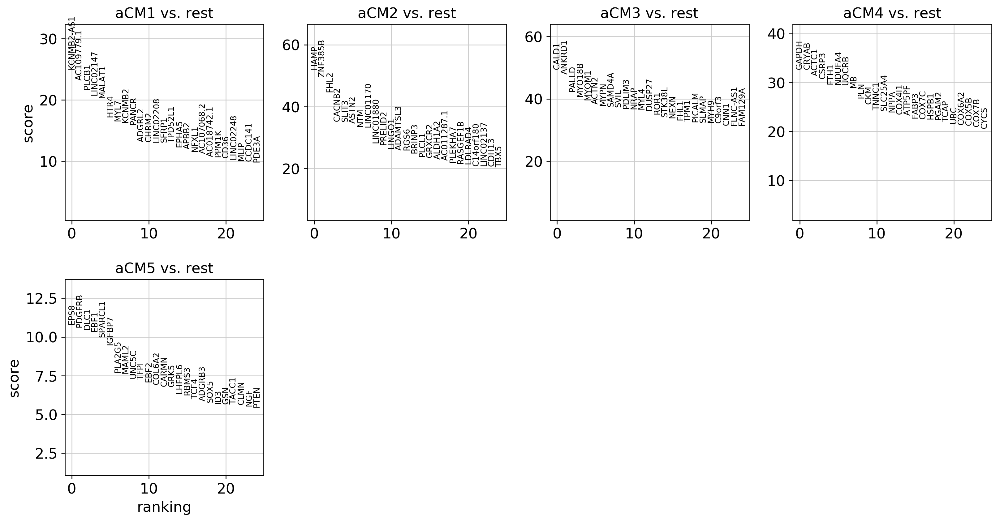

In [60]:
sc.tl.rank_genes_groups(cm_bbknn, 'cell_states', method = 'wilcoxon', n_genes=2000)
sc.pl.rank_genes_groups(cm_bbknn, n_genes=25, sharey=False)

In [61]:
wilcox_clusters = filter_by_expression(cm_bbknn, 'cell_states', key='rank_genes_groups')

In [62]:
wilcox_clusters

,aCM1_names,aCM1_pvals_adj,aCM1_logfoldchanges,aCM1_pc_cells_in,aCM1_pc_cells_out,aCM1_expr_in,aCM1_expr_out,aCM2_names,aCM2_pvals_adj,aCM2_logfoldchanges,...,aCM4_pc_cells_out,aCM4_expr_in,aCM4_expr_out,aCM5_names,aCM5_pvals_adj,aCM5_logfoldchanges,aCM5_pc_cells_in,aCM5_pc_cells_out,aCM5_expr_in,aCM5_expr_out
0,KCNMB2-AS1,4.107551e-135,0.372696,0.700970,0.630968,1.690781,1.305852,HAMP,0.000000e+00,2.247937,...,0.351338,1.525817,0.575633,EPS8,1.379331e-24,2.607167,0.547872,0.109938,0.937398,0.153847
1,AC109779.1,7.366955e-117,0.872391,0.401242,0.241083,0.772583,0.422017,ZNF385B,0.000000e+00,0.766821,...,0.610584,2.226952,1.226027,PDGFRB,8.618388e-24,4.730292,0.468085,0.021807,0.797430,0.030042
2,PLCB1,3.152351e-102,0.501521,0.550563,0.437252,1.088245,0.768695,FHL2,0.000000e+00,1.161460,...,0.834262,3.269031,2.275307,DLC1,5.360226e-23,1.021740,0.771277,0.499506,1.857164,0.914693
3,LINC02147,2.752958e-93,0.351388,0.660070,0.573316,1.613811,1.264950,CACNB2,4.907235e-269,0.272635,...,0.453475,1.696316,0.785863,EBF1,1.679135e-22,3.459318,0.484043,0.052973,0.815725,0.074163
4,MALAT1,1.259993e-89,0.032076,1.000000,1.000000,7.585917,7.419120,SLIT3,5.203287e-268,0.793737,...,0.352571,1.441406,0.579209,SPARCL1,7.138076e-21,2.427260,0.521277,0.121614,0.950354,0.176688
5,HTR4,3.593471e-64,0.656487,0.378269,0.262974,0.652517,0.413972,ASTN2,5.182137e-260,0.787386,...,0.290567,1.281850,0.460887,IGFBP7,8.457086e-19,1.498592,0.617021,0.259584,1.161322,0.410990
6,MYL7,3.418221e-59,0.077800,0.962825,0.966220,3.598405,3.409485,NTM,1.896447e-244,1.002571,...,0.273034,1.284986,0.437999,PLA2G5,4.709170e-12,1.497378,0.521277,0.233140,0.956295,0.338716
7,KCNMB2,2.090721e-57,0.963030,0.263795,0.144084,0.447329,0.229470,LINC01170,2.532831e-241,1.016045,...,0.489681,1.718596,0.869436,MAML2,7.865180e-12,1.270497,0.553191,0.258253,1.013583,0.420147
8,PANCR,5.151552e-55,1.592459,0.181529,0.060577,0.270107,0.089569,LINC01880,1.886414e-172,1.338891,...,0.596703,2.097335,1.246034,UNC5C,8.975546e-11,2.739172,0.367021,0.060914,0.562232,0.084206
9,ADGRL2,1.613226e-37,0.122448,0.755995,0.763540,1.800010,1.653535,PRELID2,4.239085e-166,0.555134,...,0.477947,1.593090,0.855616,TFPI,1.606721e-10,3.087135,0.351064,0.046791,0.550709,0.064804


In [63]:
wilcox_clusters.to_csv(tables_dir + 'atrial_cm_2000_wilcox_markers.csv')

saving figure to file /fast/AG_Huebner/huebner3/ANALYSES/20191112_cs_HH_England/scanpy/20200629/LA_RA_cms/Results/Figures/dotplot_atrial_cm_wilcox_markers_filtered_10.png


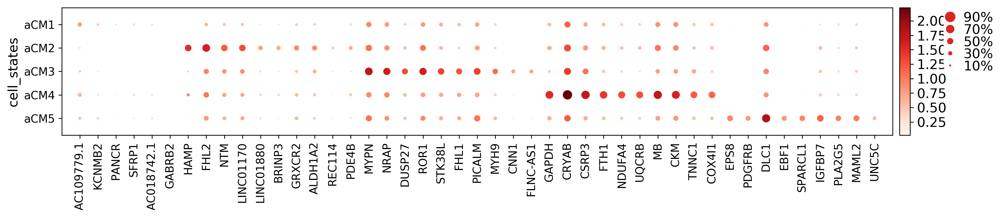

In [64]:
sc.pl.dotplot(cm_bbknn,
              makevector_topmarkers(cm_bbknn, 10, ldFC_cutoff=0.8, pvals_adj_cutoff=10**-10),
              groupby='cell_states', use_raw=True, save = "_atrial_cm_wilcox_markers_filtered_10.png")

saving figure to file /fast/AG_Huebner/huebner3/ANALYSES/20191112_cs_HH_England/scanpy/20200629/LA_RA_cms/Results/Figures/dotplot_atrial_cm_wilcox_markers_filtered_5.png


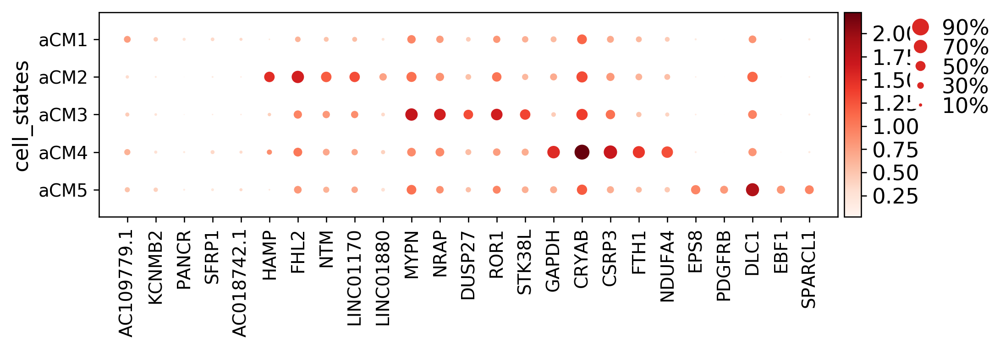

In [65]:
sc.pl.dotplot(cm_bbknn,
              makevector_topmarkers(cm_bbknn, 5, ldFC_cutoff=0.8, pvals_adj_cutoff=10**-10),
              groupby='cell_states', use_raw=True, save = "_atrial_cm_wilcox_markers_filtered_5.png")

In [66]:
cm_bbknn.write(bbknn_results_file)

saving figure to file /fast/AG_Huebner/huebner3/ANALYSES/20191112_cs_HH_England/scanpy/20200629/LA_RA_cms/Results/Figures/umap_aCM_region.png


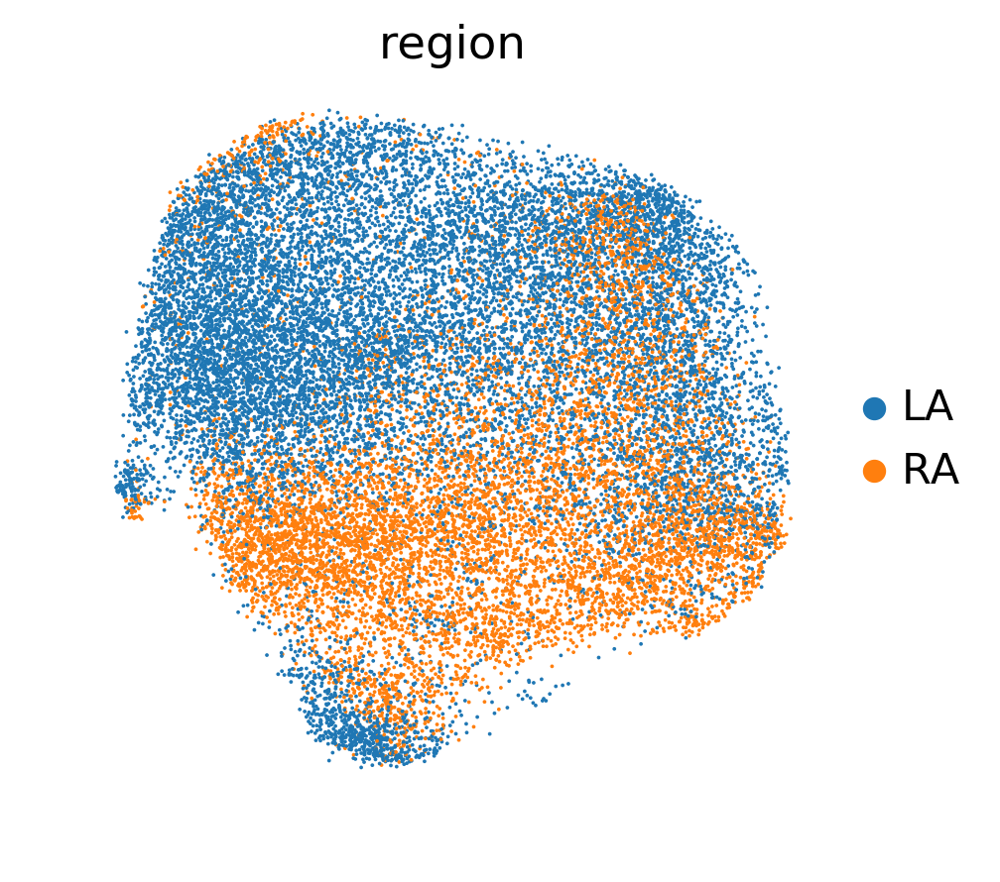

In [67]:
sc.pl.umap(cm_bbknn, color=["region"], frameon=False, save = '_aCM_region.png')

saving figure to file /fast/AG_Huebner/huebner3/ANALYSES/20191112_cs_HH_England/scanpy/20200629/LA_RA_cms/Results/Figures/umap_aCM_cell_states.png


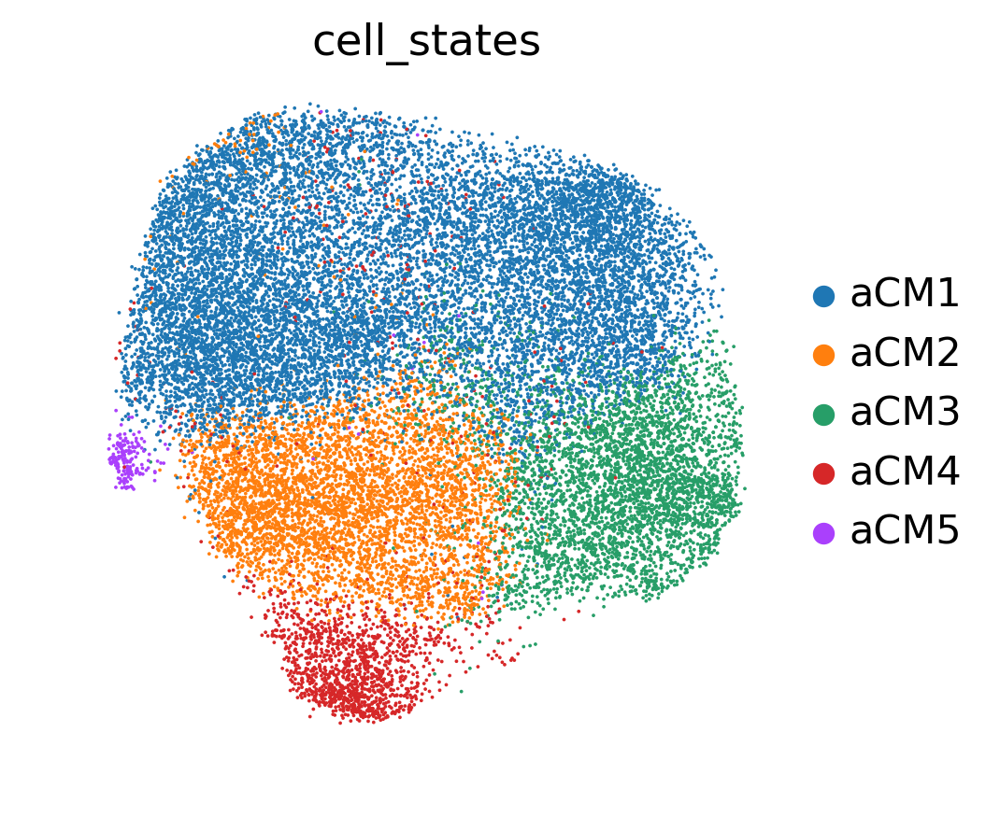

In [69]:
sc.pl.umap(cm_bbknn, color=["cell_states"], frameon=False, save = '_aCM_cell_states.png')

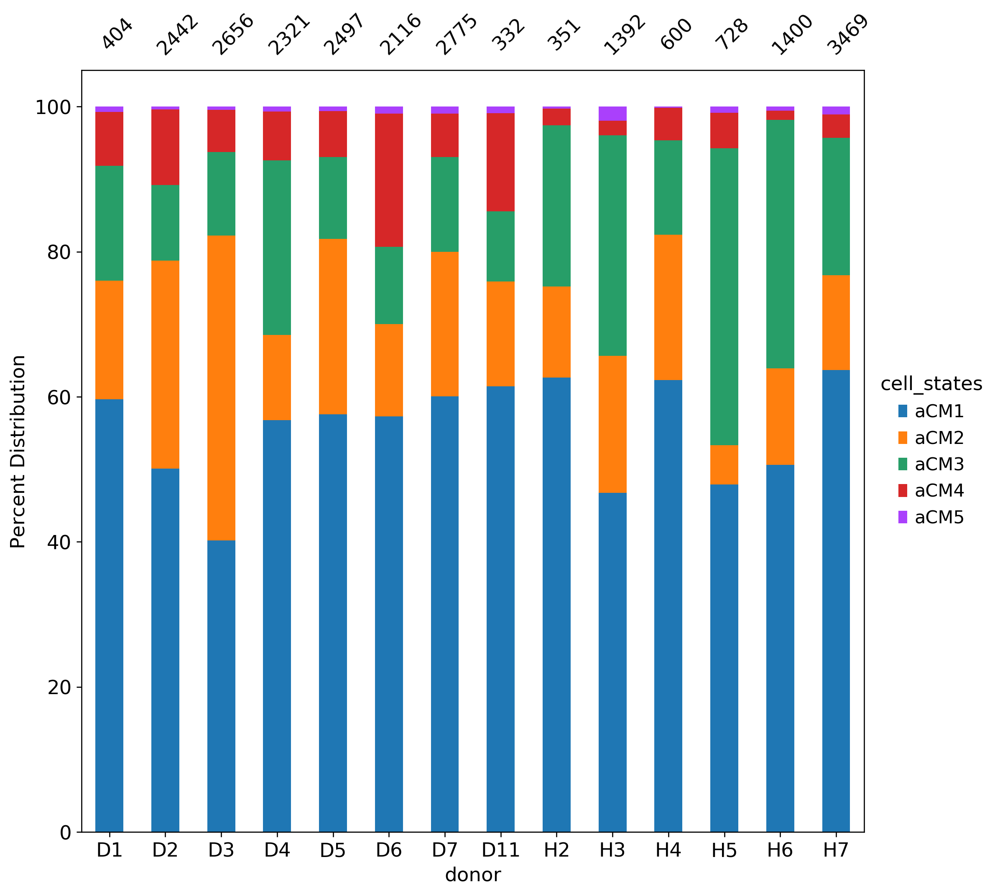

In [71]:
figname = sc.settings.figdir + 'Atrial_CMs_donor_distribution_subclusters.png'
stacked_barplot_plain_donor(cm_bbknn, 'donor', 'cell_states', 'donor', 'cell_states', figname)

In [72]:
tab = pd.crosstab(cm_bbknn.obs['cell_states'],
cm_bbknn.obs['donor'])
tab

donor,D1,D2,D3,D4,D5,D6,D7,D11,H2,H3,H4,H5,H6,H7
cell_states,,,,,,,,,,,,,,
aCM1,241,1224,1068,1318,1438,1213,1667,204,220,651,374,349,709,2209
aCM2,66,700,1116,273,604,268,552,48,44,263,120,39,186,454
aCM3,64,254,305,558,282,226,363,32,78,423,78,298,479,656
aCM4,30,254,155,156,157,389,166,45,8,28,27,36,18,112
aCM5,3,10,12,16,16,20,27,3,1,27,1,6,8,38


In [73]:
tab = pd.crosstab(cm_bbknn.obs['region'],
cm_bbknn.obs['cell_states'], normalize='index')
tab

cell_states,aCM1,aCM2,aCM3,aCM4,aCM5
region,,,,,
LA,0.737950,0.064311,0.117587,0.070336,0.009816
RA,0.227758,0.434278,0.270807,0.062220,0.004936


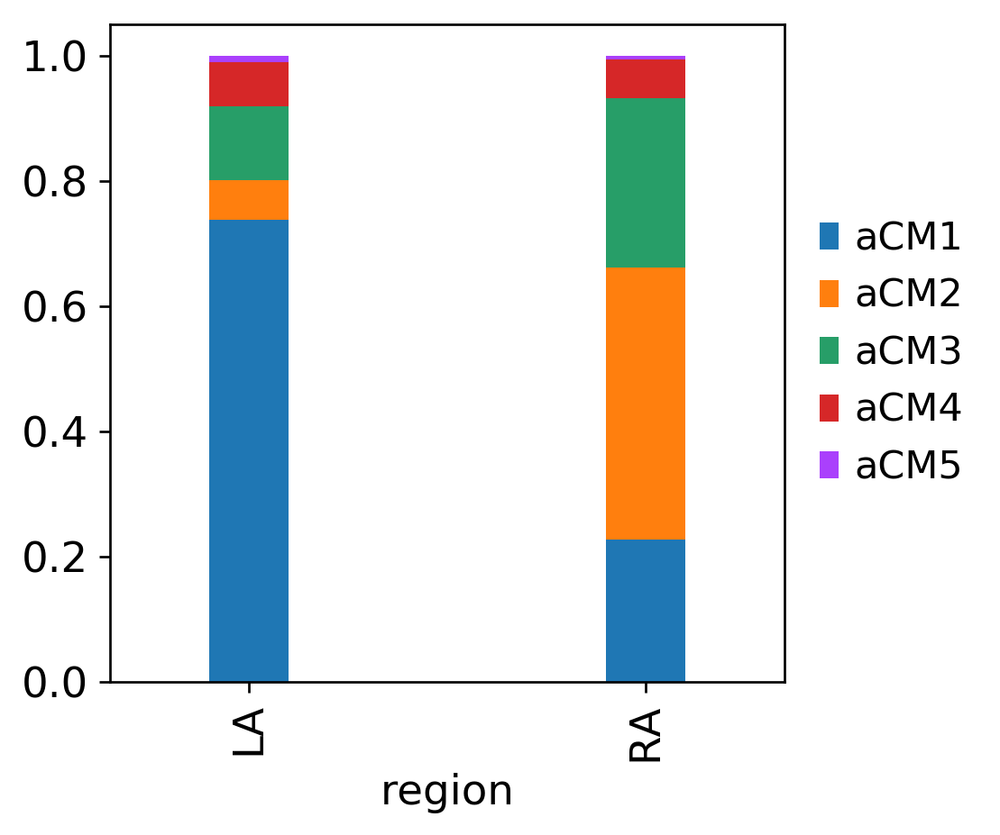

In [75]:
tab.plot.bar(stacked=True, width=0.2)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid(b=None)
lgd = plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), frameon=False)
plt.savefig(sc.settings.figdir + 'bar_chart_atrial_regions.png', bbox_extra_artists=(lgd,), bbox_inches='tight')

saving figure to file /fast/AG_Huebner/huebner3/ANALYSES/20191112_cs_HH_England/scanpy/20200629/LA_RA_cms/Results/Figures/dotplot_aCM_bbknn_selected_markers.png


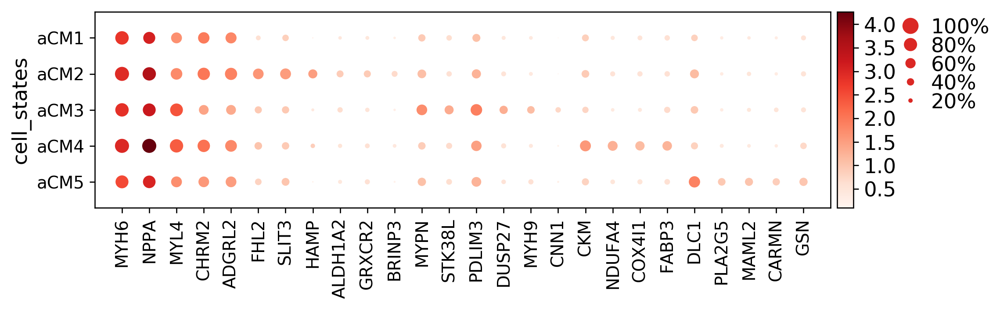

In [76]:
selected_genes = ['MYH6', 'NPPA', 'MYL4', 'CHRM2', 'ADGRL2', 'FHL2', 'SLIT3', 'HAMP', 'ALDH1A2', 'GRXCR2', 'BRINP3', 'MYPN', 'STK38L', 'PDLIM3', 'DUSP27', 'MYH9', 'CNN1', 'CKM', 'NDUFA4', 'COX4I1', 'FABP3', 'DLC1', 'PLA2G5', 'MAML2', 'CARMN', 'GSN']


sc.pl.dotplot(cm_bbknn,
              selected_genes,
              groupby='cell_states', use_raw=True, save = "_aCM_bbknn_selected_markers.png")